In [259]:
from facenet_pytorch import MTCNN as facenet
from facenet_pytorch import InceptionResnetV1
import os  
import cv2
from collections import defaultdict
from tqdm.auto import tqdm
import numpy as np 
from PIL import Image
# import faiss 
import json
from IPython.display import display
from annoy import AnnoyIndex

In [90]:
working_dir = "../../RunnerTrainCase"

os.path.isdir(working_dir)

True

In [67]:
def is_image_file(filename, extensions=['.jpg', '.jpeg', '.tiff', '.png']):
    return any(filename.endswith(e) for e in extensions)


In [10]:
total_image = 0
images_list = []

for path, _ , files in os.walk(working_dir):
    for file in filter(is_image_file, files):
        image_path = os.path.join(path, file)
        total_image += 1
        images_list.append(image_path)










# for face in faces:

#     x = face['box'][0]
#     y = face['box'][1]
#     w = face['box'][2]
#     h = face['box'][3]

#     left_eye, right_eye = face['keypoints']['left_eye'], face['keypoints']['right_eye']
#     left_eye_x, left_eye_y = left_eye
#     right_eye_x, right_eye_y = right_eye
    
#     if left_eye_y < right_eye_y:
#         point_3rd = (right_eye_x,left_eye_y)
#         direction = -1
#     else:
#         point_3rd = (left_eye_x, right_eye_y)
#         direction = 1
        
    
#     delta_x = right_eye_x - left_eye_x
#     delta_y = right_eye_y - left_eye_y
#     angle = np.arctan(delta_y/delta_x)
#     angle = (angle * 180) / np.pi


#     img = img[y:y+h, x:x+w]

#     f_h= img.shape[0]
#     f_w = img.shape[1]

#     center_img = (f_w // 2, f_h // 2)

#     M = cv2.getRotationMatrix2D(center_img , (angle), 1.0)

    
#     rotated = cv2.warpAffine(img, M, (f_w,f_h))
 

In [214]:
class FacePrepare:

    def __init__(self):
        self.facenet = facenet(image_size=160,margin=10)
        self.face_encoder = InceptionResnetV1(pretrained="vggface2").eval()
        
    def detect_faces(self,img):

        face = {}

        faces = self.facenet.detect(img, landmarks=True)

        if any(map(lambda x: x is None, faces)) == False:
    #     print(faces)

            faces_box = faces[0]
            faces_conf = faces[1]
            landmarks= faces[2]
        

            for i,(face_box,face_conf,landmark ) in enumerate(zip(faces_box,faces_conf,landmarks)):
                #     print(i,face_box,face_conf,landmark )

                    right_eye = (round(landmark[0][0]),round(landmark[0][1]))
                    left_eye = (round(landmark[1][0]),round(landmark[1][1]))
                    x,y,w,h = round(face_box[0]),round(face_box[1]),round(face_box[2]),round(face_box[3])

                    bbox = {

                                "x": x,
                                "y": y,
                                "w": w,
                                "h": h,

                        }
                    face_attibute = {
                                "face_box":bbox,
                                "confident":face_conf,
                                "right_eye":right_eye,
                                "left_eye":left_eye

                        }
                    face[i] = face_attibute
                

        return face

    @staticmethod
    def align_face(image_path, face):

        img = cv2.imread(image_path)
        face_pos = face['face_box']

        right_eye_pos = face['right_eye']
        left_eye_pos = face['left_eye']

        x = face_pos['x']
        y = face_pos['y']
        w = face_pos['w']
        h = face_pos['h']

        left_eye_x, left_eye_y = left_eye_pos
        right_eye_x, right_eye_y = right_eye_pos

        if left_eye_y < right_eye_y:
            point_3rd = (right_eye_x, left_eye_y)
            direction = -1
        else:
            point_3rd = (left_eye_x, right_eye_y)
            direction = 1

        delta_x = right_eye_x - left_eye_x
        delta_y = right_eye_y - left_eye_y
        angle = np.arctan(delta_y/delta_x)
        angle = (angle * 180) / np.pi

        img = img[y:y+h, x:x+w]

        f_h = img.shape[0]
        f_w = img.shape[1]

        center_img = (f_w // 2, f_h // 2)

        M = cv2.getRotationMatrix2D(center_img, (angle), 1.0)

        rotated = cv2.warpAffine(img, M, (f_w, f_h))

        return rotated


        



In [215]:
f = 512
t = AnnoyIndex(f, 'angular')

In [216]:
FacePrepare = FacePrepare()

In [217]:
db = {}
for idx,image_path in tqdm(enumerate(images_list)):
    img = cv2.imread(image_path)

    try:
        detected_faces = FacePrepare.detect_faces(img)
        # print(detected_faces)
        if len(detected_faces) > 0:
            for i,_ in enumerate(detected_faces):
                __face = detected_faces[i]
                # cropped = FacePrepare.align_face(image_path, __face)
                tensor_face = FacePrepare.facenet(img)
                embedding = FacePrepare.face_encoder(tensor_face.unsqueeze(0)).cpu().detach().numpy()
                t.add_item(idx, embedding[0])
                _id = image_path.split('/')[3]
                id,name = _id.split("_")
                
                db[idx] = {
                    "id":f"{id}",
                    "name":f"{name}",
                    "image_path":image_path,
                    "face_pos":__face
                }
                
                # print(embedding)
            
                # print(tensor_face)
    except Exception as err:
        print(err)
            
    
    
    

45it [00:33,  1.36it/s]


In [218]:
t.build(40) # 10 trees
t.save('index.ann')

True

In [219]:
u = AnnoyIndex(f, 'angular')
u.load('index.ann') # super fast, will just mmap the file

True

In [220]:
u.get_n_items()

45

In [257]:
test_image = cv2.imread('../../Runner/R09_Dom/line_691740411122573.jpg')
test_image_pil = cv2.cvtColor(test_image,cv2. COLOR_BGR2RGB)

In [260]:
detected_face = FacePrepare.detect_faces(test_image)

In [261]:
detected_face 


{0: {'face_box': {'x': 650, 'y': 596, 'w': 1190, 'h': 1287},
  'confident': 0.99998426,
  'right_eye': (797, 859),
  'left_eye': (1047, 889)},
 1: {'face_box': {'x': 335, 'y': 776, 'w': 416, 'h': 867},
  'confident': 0.77258956,
  'right_eye': (368, 813),
  'left_eye': (391, 808)}}

In [262]:
tensor_face = FacePrepare.facenet(test_image)
embedding = FacePrepare.face_encoder(tensor_face.unsqueeze(0)).cpu().detach().numpy()


In [263]:
embedding


array([[ 0.03625357,  0.00515937, -0.02795888, -0.01916253,  0.06639791,
        -0.01773745,  0.00297426, -0.00663857, -0.03482561,  0.07925606,
         0.0740556 , -0.00989106,  0.0089006 ,  0.01705639,  0.02276564,
        -0.0254613 ,  0.0472321 ,  0.05880554, -0.06572697,  0.07267383,
         0.04211773, -0.01319548,  0.01836233, -0.05500301, -0.07174582,
        -0.01297968,  0.02274837, -0.03942101,  0.02704771, -0.00016765,
         0.01143197,  0.02361134, -0.01052479,  0.11442038,  0.03183417,
        -0.11554851, -0.04418642, -0.11762742, -0.0536848 ,  0.03059379,
        -0.06040903, -0.00140786, -0.03730002,  0.08395904, -0.03286584,
         0.05171668,  0.04344853,  0.03533978, -0.0449876 , -0.01802646,
        -0.07334067, -0.02138643,  0.0922173 ,  0.04935447,  0.03403567,
        -0.07328641, -0.02941404,  0.0183232 , -0.01067261,  0.0544049 ,
         0.03891077,  0.04912186, -0.02185768, -0.03835205,  0.04127285,
        -0.05535368, -0.01436686, -0.03590901,  0.0

In [264]:
result,dist = u.get_nns_by_vector(embedding[0],n=5,search_k=200,include_distances=True)

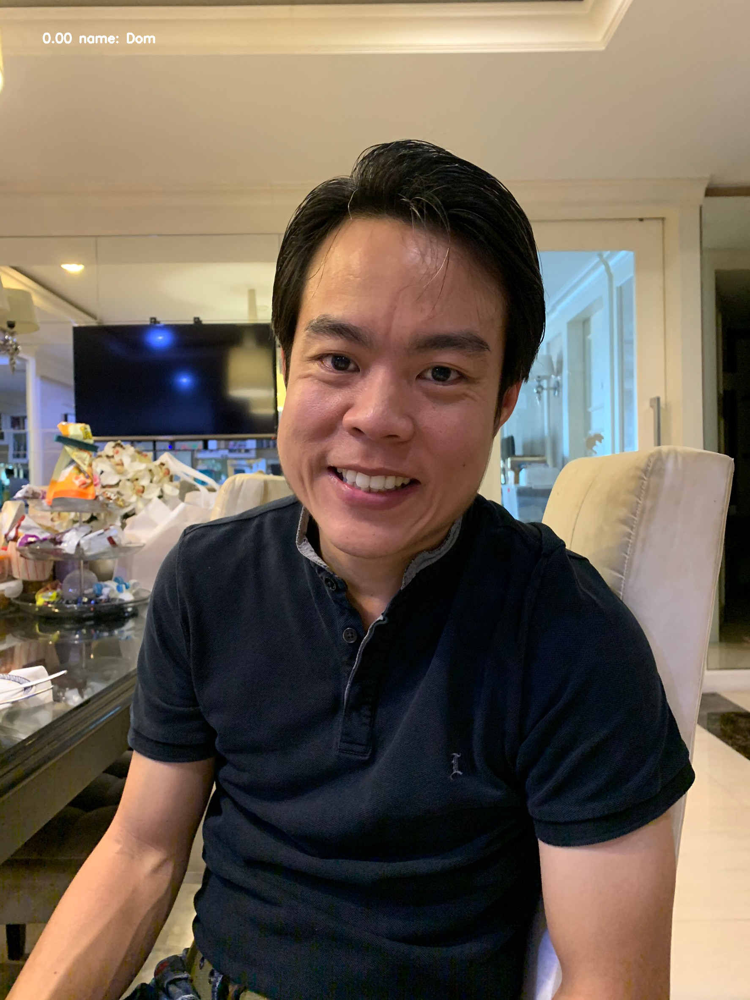

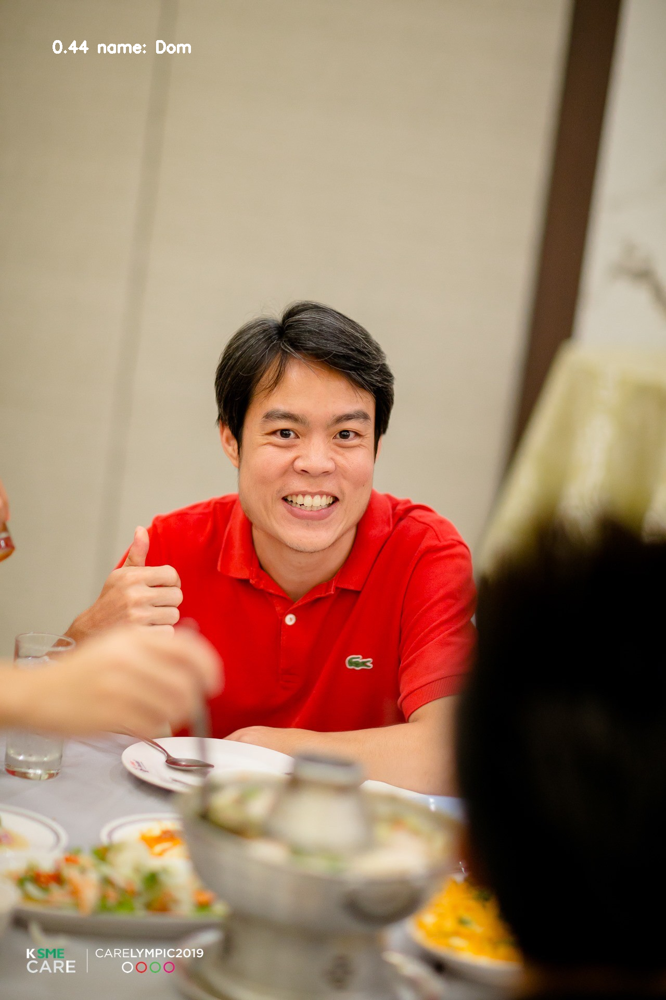

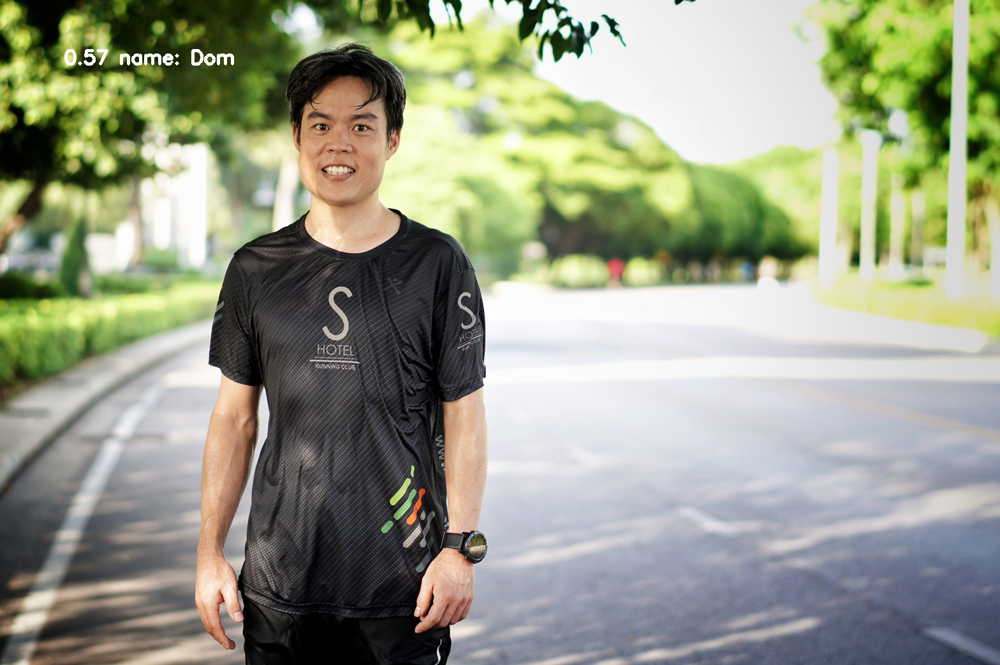

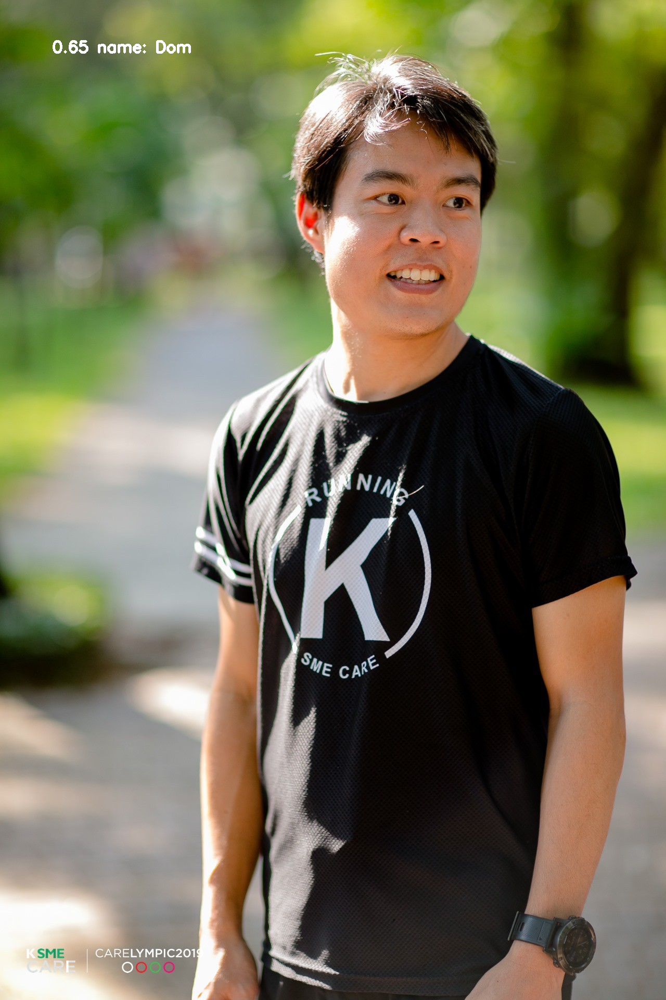

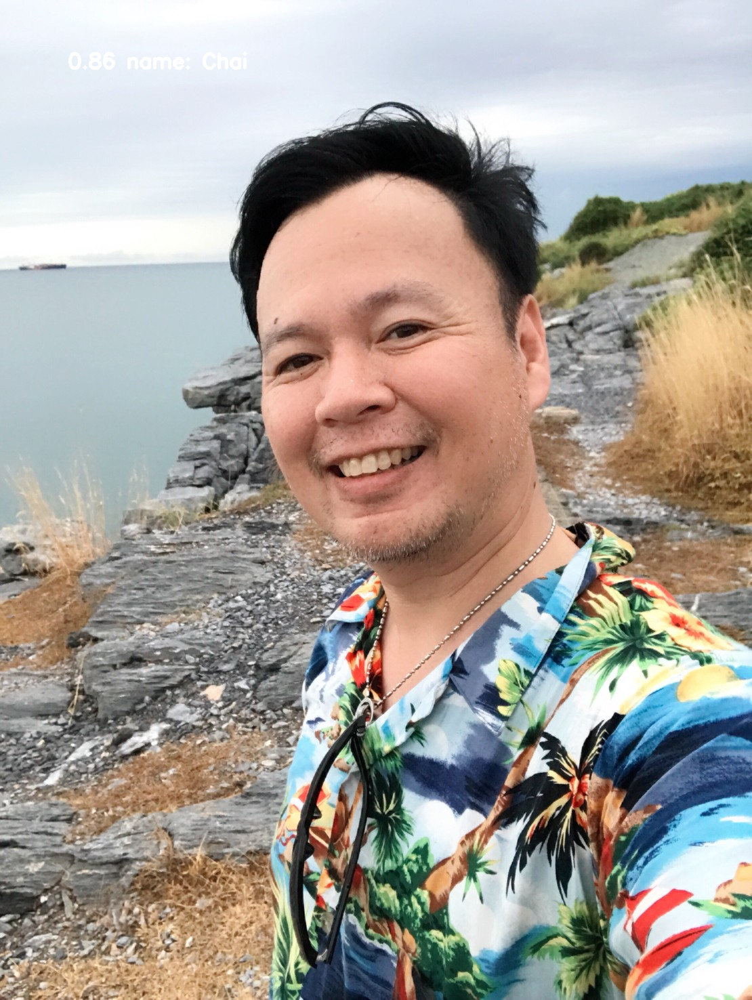

In [265]:
for idx,dis in zip(result,dist):
    best_match = cv2.imread(db[idx]["image_path"])
    
    cv2.putText(best_match,text=f"{dis:.2f} name: {db[idx]['name']}",org=(100,100),fontFace=cv2.FONT_HERSHEY_SIMPLEX,fontScale=1,color=(255,255,255),thickness=4)
    best_match_pil = cv2.cvtColor(best_match,cv2. COLOR_BGR2RGB)
    best_match_pil = Image.fromarray(best_match_pil)
    display(best_match_pil)